# Project 2

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import skew, shapiro

from sklearn import metrics
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LassoCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer

from dython.nominal import identify_nominal_columns
from dython.nominal import associations

%config InlineBackend.figure_format = 'retina'

### Import Datasets

In [2]:
train_clean = pd.read_csv('../datasets/train_pop_NaN.csv')
test_clean = pd.read_csv('../datasets/test_pop_NaN.csv')

/var/folders/r4/61_m3nz133bcpt1gp9t0vyq00000gn/T/ipykernel_12950/914542660.py:1: DtypeWarning: Columns (42) have mixed types. Specify dtype option on import or set low_memory=False.
  train_clean = pd.read_csv('../datasets/train_pop_NaN.csv')
/var/folders/r4/61_m3nz133bcpt1gp9t0vyq00000gn/T/ipykernel_12950/914542660.py:2: DtypeWarning: Columns (41) have mixed types. Specify dtype option on import or set low_memory=False.
  test_clean = pd.read_csv('../datasets/test_pop_NaN.csv')


## Preprocessing and Modeling
- Are categorical variables one-hot encoded?
- Does the student investigate or manufacture features with linear relationships to the target?
- Have the data been scaled appropriately?
- Does the student properly split and/or sample the data for validation/training purposes?
- Does the student utilize feature selection to remove noisy or multi-collinear features?
- Does the student test and evaluate a variety of models to identify a production algorithm (**AT MINIMUM:** linear regression, lasso, and ridge)?
- Does the student defend their choice of production model relevant to the data at hand and the problem?
- Does the student explain how the model works and evaluate its performance successes/downfalls?



### Select X Variables - 2nd Round

Second round of X variables selection is based on domain knowledge as well as common variables found between Select K Best (top 20) and Lasso (more than 0 or less than 0).

In [3]:
lst_sel_cols=['town', 'full_flat_type', 'floor_area_sqm',
       'tranc_year', 'mid', 'hdb_age', 'max_floor_lvl',
    'total_dwelling_units', 
    'mall_nearest_distance', 'resale_price',
       'hawker_nearest_distance', 'hawker_within_2km',
       'hawker_market_stalls', 'mrt_nearest_distance', 'bus_interchange',
       'pri_sch_nearest_distance', 'sec_sch_nearest_dist']
train_clean_sel = train_clean[lst_sel_cols]

In [4]:
train_clean_sel.shape

(150634, 17)

### Scatter Plot

In [5]:
# list of numerical columns
numerical_features=train_clean_sel._get_numeric_data().columns.tolist()
numerical_features

['floor_area_sqm',
 'tranc_year',
 'mid',
 'hdb_age',
 'max_floor_lvl',
 'total_dwelling_units',
 'mall_nearest_distance',
 'resale_price',
 'hawker_nearest_distance',
 'hawker_within_2km',
 'hawker_market_stalls',
 'mrt_nearest_distance',
 'bus_interchange',
 'pri_sch_nearest_distance',
 'sec_sch_nearest_dist']

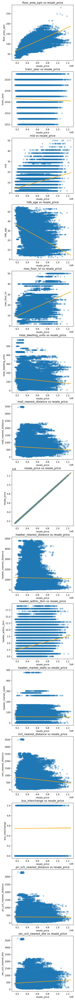

In [6]:
fig, axes = plt.subplots(len(numerical_features),1,figsize=(5,80))
count=0                        
for i in numerical_features:
    ttl=i+' vs resale_price'
    sns.regplot(data=train_clean_sel,x='resale_price',y=i,ax=axes[count],scatter_kws={'alpha':0.3},
                line_kws={"color": "orange",'alpha':0.9}).set(title=ttl)
    count+=1

In [7]:
# identify categorical cols
categorical_features = identify_nominal_columns(train_clean_sel)
categorical_features

['town', 'full_flat_type']

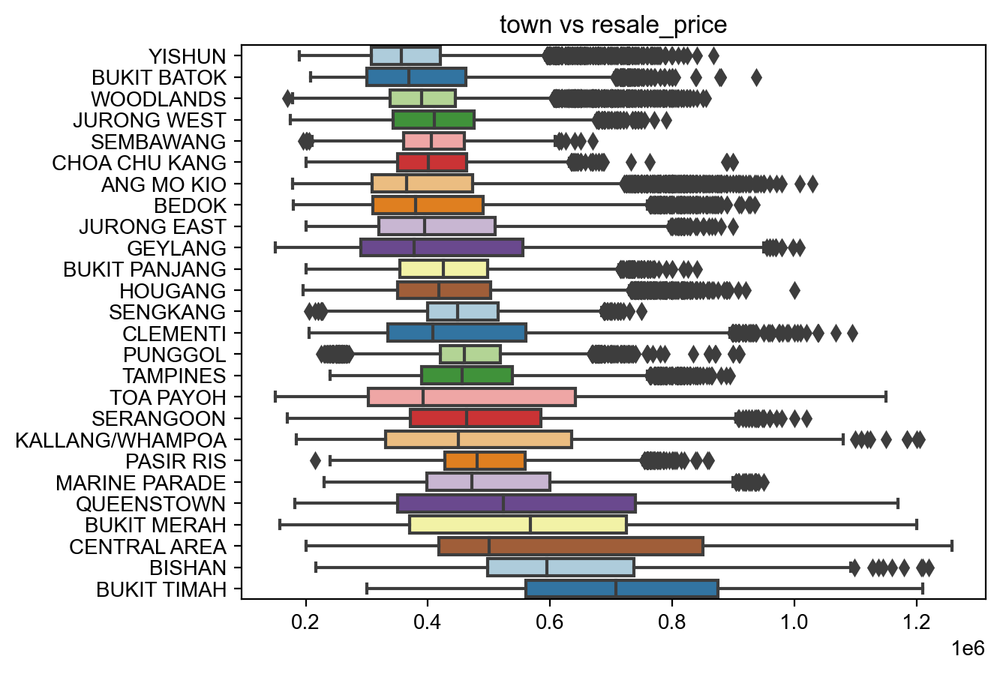

In [8]:
# create sorted index by `resale_price`
grp_town=train_clean_sel.groupby('town')
df=pd.DataFrame({col:vals['resale_price'] for col,vals in grp_town})
town_idx=df.mean().sort_values().index
# sort boxplot by mean                       
ttl='town vs resale_price'
sns.boxplot(data=df[town_idx],palette='Paired',orient='h').set(title=ttl)
sns.set(rc={'figure.figsize':(18,8)})

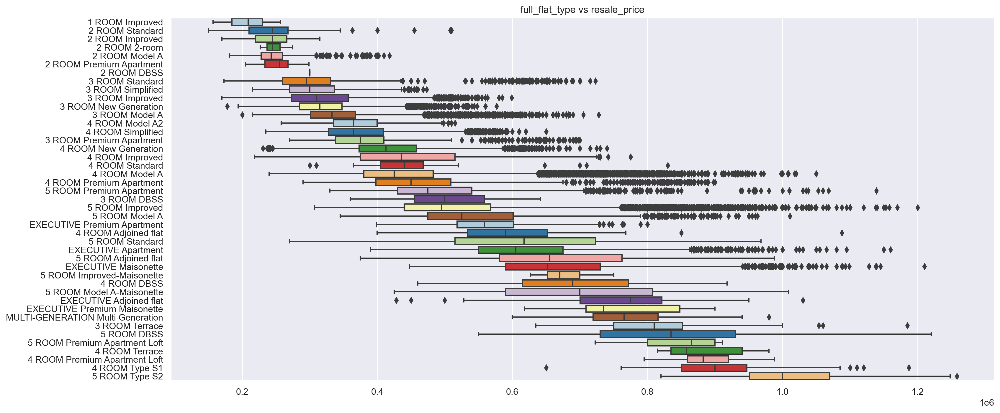

In [9]:
# create sorted index by `resale_price`
grp_fft=train_clean_sel.groupby('full_flat_type')
df=pd.DataFrame({col:vals['resale_price'] for col,vals in grp_fft})
fft_idx=df.mean().sort_values().index
# sort boxplot by mean                       
ttl='full_flat_type vs resale_price'
sns.boxplot(data=df[fft_idx],palette='Paired',orient='h').set(title=ttl)
sns.set(rc={'figure.figsize':(15,5)})

### Dummify Variables

In [10]:
df_dummies=pd.get_dummies(train_clean_sel, drop_first=False)

### X and y Variables

In [11]:
X = df_dummies.drop('resale_price',axis=1)
y = train_clean['resale_price']

### Model Prep: Train/test split

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size=0.75)

### Model Prep: StandardScaler

In [13]:
ss = StandardScaler()
ss.fit(X_train)
X_train_sc = ss.transform(X_train)
X_test_sc = ss.transform(X_test)

### Linear Regression (StandardScaler)

In [14]:
# Create an instance of linear regression
lr = LinearRegression()

In [15]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lr, X_train_sc, y_train, cv=8).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lr, X_test_sc, y_test, cv=8).mean()}')

Cross-Validation Score on training set: -2.5386924792846435e+22
Cross-Validation Score on testing set: -1.2333713643551445e+23


In [16]:
# Fit model instance on train data
lr.fit(X_train_sc, y_train)

LinearRegression()

In [17]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {lr.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {lr.score(X_test_sc, y_test)}')

R^2 on training set: 0.8888841153930851
R^2 on testing set: 0.8888145800066055


In [18]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)))}')

MSE on training set: 2287812549.7084556
MSE on testing set: 2265600324.231855


In [19]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47831.083509664044
RMSE on testing set: 47598.322703976184
RMSE (on training set) over mean y value: 0.10648972225020235
RMSE (on testing set) over mean y value: 0.10597151041535179


                                         Column_Name  Coefficient_Value
3                                            hdb_age      -4.836810e+04
10                              mrt_nearest_distance      -2.402227e+04
1                                         tranc_year      -1.643857e+04
7                            hawker_nearest_distance      -1.463168e+04
5                               total_dwelling_units      -5.888986e+03
6                              mall_nearest_distance      -4.561843e+03
12                          pri_sch_nearest_distance       3.758944e+03
11                                   bus_interchange       4.397371e+03
13                              sec_sch_nearest_dist       4.888277e+03
9                               hawker_market_stalls       6.626025e+03
4                                      max_floor_lvl       1.867474e+04
2                                                mid       1.877273e+04
8                                  hawker_within_2km       2.442

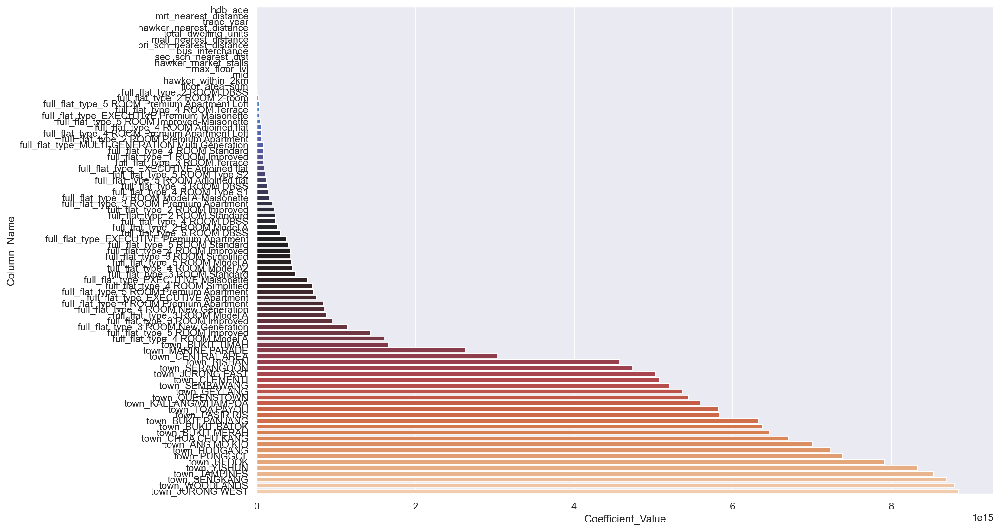

In [20]:
# Create df for storing coefficients and their corresponding variable names
lr_coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
lr_coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
lr_coefficient_df['Coefficient_Value'] = pd.Series(lr.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(lr_coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=lr_coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

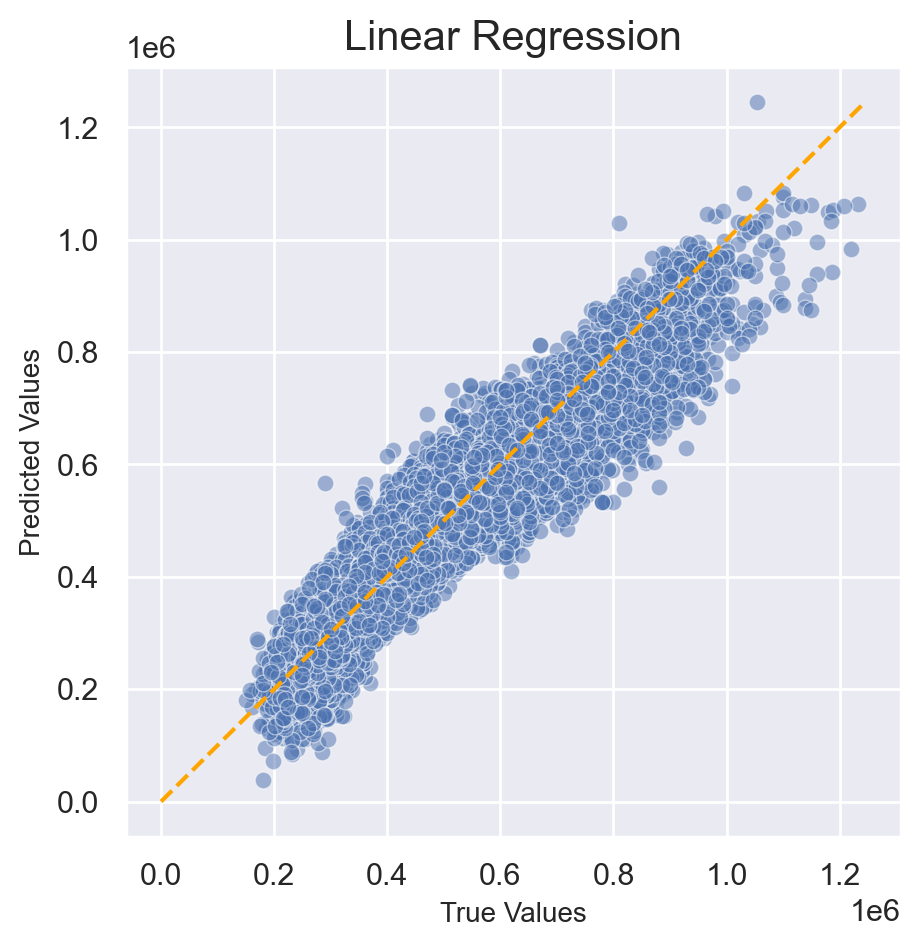

In [21]:
preds=lr.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Linear Regression', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Ridge (StandardScaler)

In [22]:
%%time
ridge_alphas = np.logspace(0, 5, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=5)
optimal_ridge.fit(X_train_sc, y_train)

print (optimal_ridge.alpha_)

8.026433522257175
CPU times: user 9min 21s, sys: 34.6 s, total: 9min 55s
Wall time: 1min 21s


In [23]:
ridge = Ridge(alpha=optimal_ridge.alpha_)

In [24]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(ridge, X_train_sc, y_train, cv=3).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(ridge, X_test_sc, y_test, cv=3).mean()}')

Cross-Validation Score on training set: 0.8885864627849132
Cross-Validation Score on testing set: 0.8881128618637456


In [25]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_ridge.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_ridge.score(X_test_sc, y_test)}')

R^2 on training set: 0.8888870648297876
R^2 on testing set: 0.8888104788966023


In [26]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)))}')

MSE on training set: 2287751822.4926634
MSE on testing set: 2265683891.6290345


In [27]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47830.44869633426
RMSE on testing set: 47599.2005356081
RMSE (on training set) over mean y value: 0.10648830892041324
RMSE (on testing set) over mean y value: 0.10597346479396515


                                         Column_Name  Coefficient_Value
3                                            hdb_age      -48298.746776
10                              mrt_nearest_distance      -24024.064419
38                                    town_WOODLANDS      -21132.970301
1                                         tranc_year      -16432.103147
7                            hawker_nearest_distance      -14496.131812
33                                    town_SEMBAWANG      -14333.776410
27                                  town_JURONG WEST      -13168.031203
22                                town_CHOA CHU KANG      -10892.484487
19                                town_BUKIT PANJANG       -9445.409603
48                    full_flat_type_3 ROOM Improved       -6867.969327
39                                       town_YISHUN       -6192.472629
58                     full_flat_type_4 ROOM Model A       -5942.267023
5                               total_dwelling_units       -5890

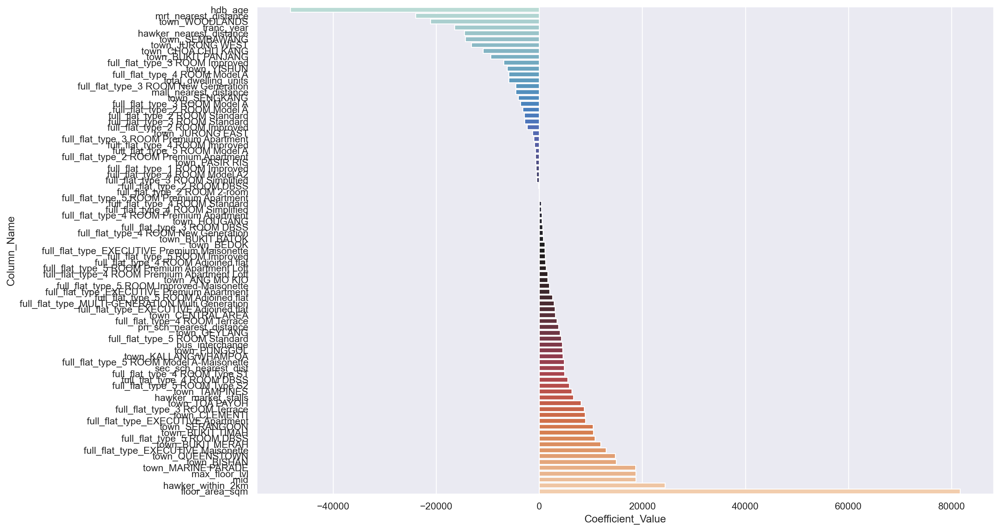

In [28]:
# Create df for storing coefficients and their corresponding variable names
ridge_coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
ridge_coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
ridge_coefficient_df['Coefficient_Value'] = pd.Series(optimal_ridge.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(ridge_coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=ridge_coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

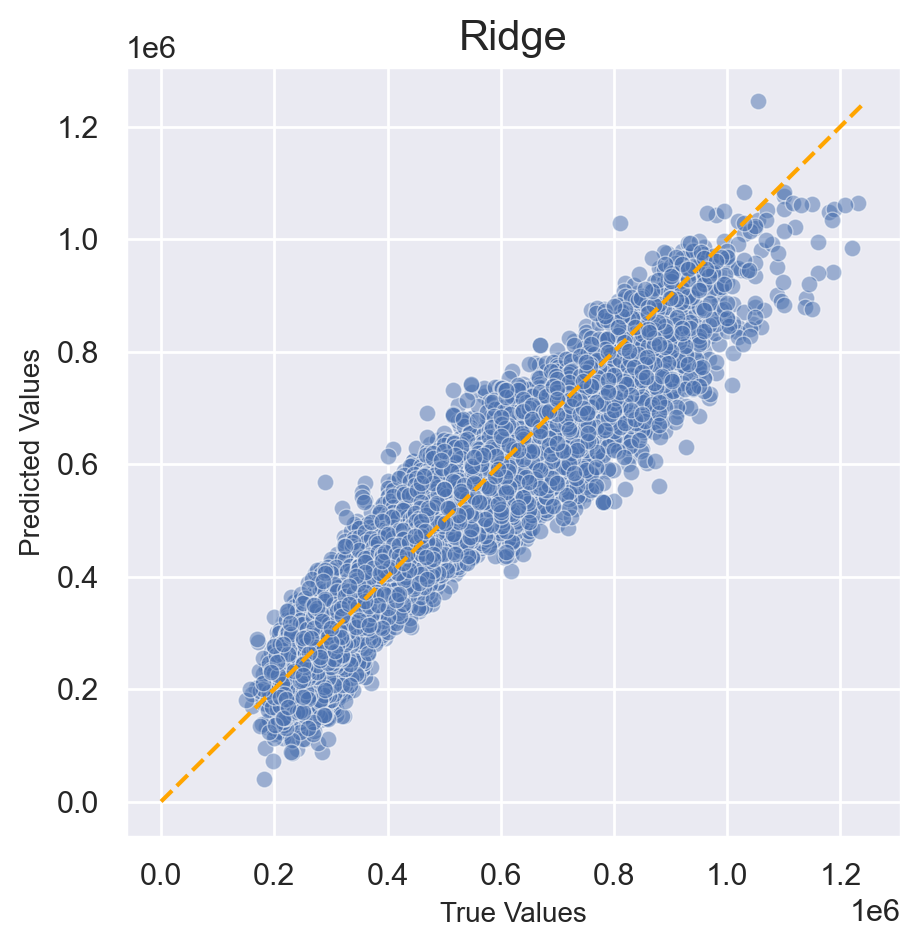

In [29]:
preds=optimal_ridge.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Ridge', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Lasso (StandardScaler)

In [30]:
# Test out 200 different alpha values on default 5-folds of data set and adopt the best performing alpha
optimal_lasso = LassoCV(n_alphas=200, cv=5)
# model fitting
optimal_lasso.fit(X_train_sc, y_train)

LassoCV(cv=5, n_alphas=200)

In [31]:
lasso = Lasso(alpha=optimal_lasso.alpha_)

In [32]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lasso, X_train_sc, y_train, cv=5).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lasso, X_test_sc, y_test, cv=5).mean()}')

Cross-Validation Score on training set: 0.8885553206041011
Cross-Validation Score on testing set: 0.8882720939743886


In [33]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_lasso.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_lasso.score(X_test_sc, y_test)}')

R^2 on training set: 0.8888033219773558
R^2 on testing set: 0.8887107726927008


In [34]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)))}')

MSE on training set: 2289476039.9564366
MSE on testing set: 2267715582.5458865


In [35]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47848.469567546636
RMSE on testing set: 47620.537402951326
RMSE (on training set) over mean y value: 0.10652843005983349
RMSE (on testing set) over mean y value: 0.1060209685699691


                                         Column_Name  Coefficient_Value
3                                            hdb_age      -48602.664176
10                              mrt_nearest_distance      -24087.185252
38                                    town_WOODLANDS      -21885.725068
1                                         tranc_year      -16313.571032
33                                    town_SEMBAWANG      -14545.552913
27                                  town_JURONG WEST      -13885.799015
7                            hawker_nearest_distance      -13803.972702
22                                town_CHOA CHU KANG      -11504.389248
19                                town_BUKIT PANJANG       -9779.083332
39                                       town_YISHUN       -6757.916623
5                               total_dwelling_units       -5903.382516
58                     full_flat_type_4 ROOM Model A       -5843.772860
48                    full_flat_type_3 ROOM Improved       -4968

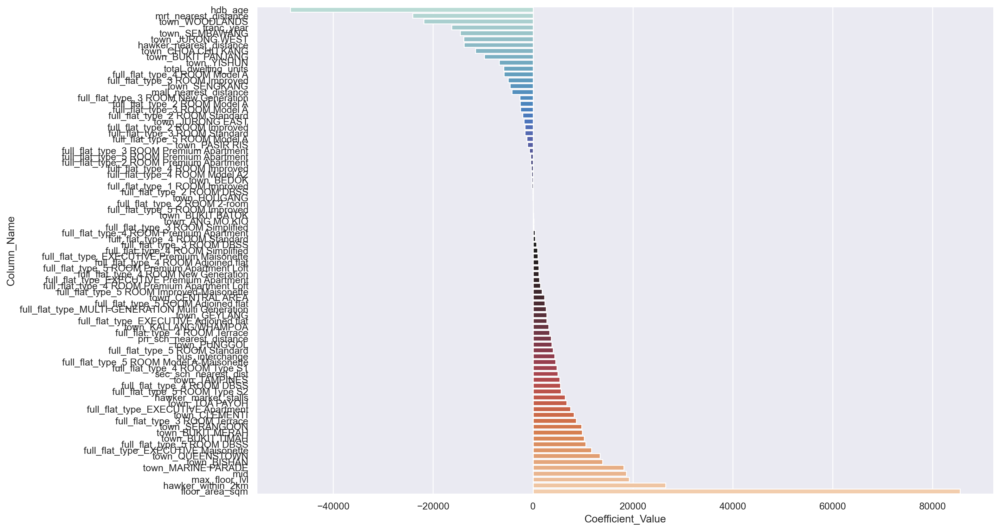

In [36]:
# Create df for storing coefficients and their corresponding variable names
lasso_coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
lasso_coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
lasso_coefficient_df['Coefficient_Value'] = pd.Series(optimal_lasso.coef_)

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(lasso_coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=lasso_coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

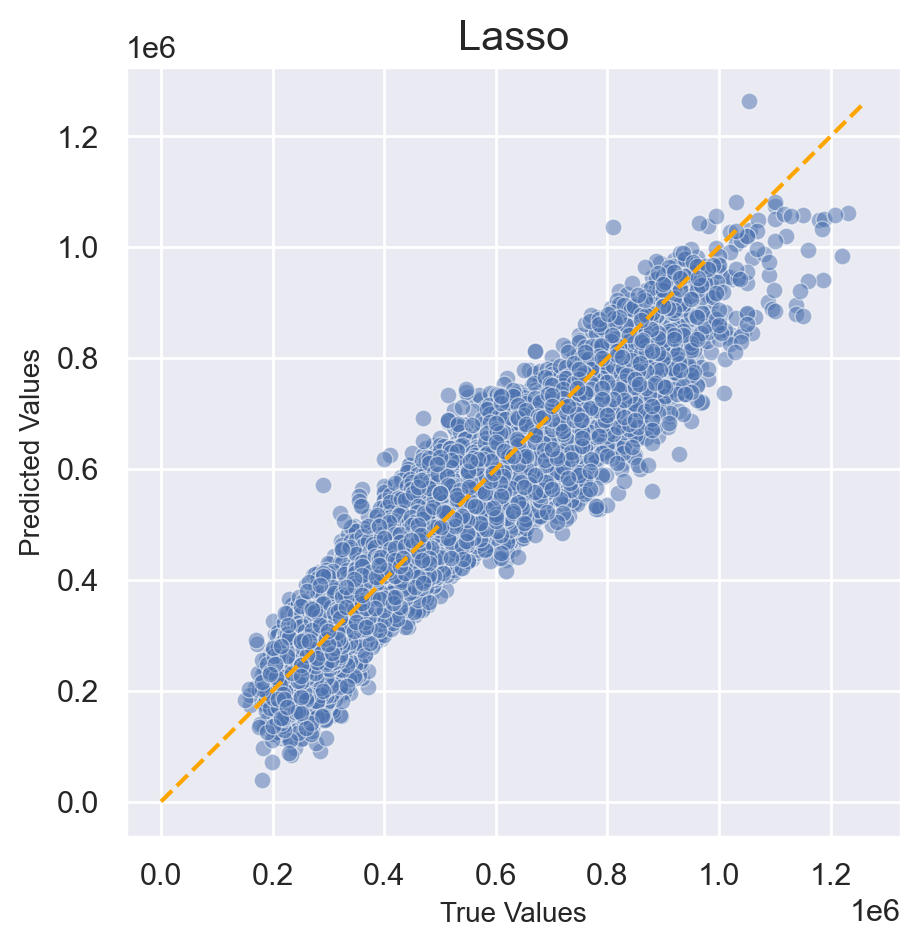

In [37]:
preds=optimal_lasso.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Lasso', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Check Normality

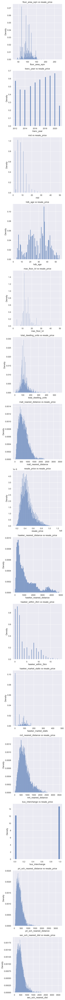

In [38]:
fig, axes = plt.subplots(len(numerical_features),1, figsize=(5,100))
count=0
for i in numerical_features:
    ttl=i+' vs resale_price'
    sns.histplot(data=train_clean_sel,x=i, stat='density',ax=axes[count]).set(title=ttl)                                           
    count+=1

In [39]:
# create function for statistical data
def normality(df, col):
    stat, p = shapiro(df[col])
    alpha = 0.05
    nl = '\n'
    if p > alpha:
        return f"p: {p}{nl}Since p > {alpha}, it cannot be concluded that {col} does not follow a normal distribution (fail to reject H0)"
    else:
        return f"p: {p}{nl}Since p <= {alpha}, it can be concluded that {col} does not follow a normal distribution (reject H0)"
      

def skewness(df,col):
    if skew(df[col]) == 0:
        pos_neg='not'
    elif skew(df[col]) > 0:
        pos_neg='positively'
    else:
        pos_neg='negatively'
    return f"Distribution of {col} is {pos_neg} skewed, with skew at: {skew(df[col])}"

def statistical_data(df,col):
    nl = '\n'
    return f"Statistical Data for {col}{nl}Mean: {df[col].mean()}{nl}Standard Deviation: {df[col].std()}{nl}{normality(df, col)}{nl}{skewness(df,col)}"

In [40]:
lst_log=[]
for i in numerical_features:
    print(statistical_data(train_clean_sel,i))
    print('\n')
    if skew(train_clean_sel[i]) > 0.7:
        lst_log.append(i)
        train_clean_sel[i]=np.log2(train_clean_sel[i] + 1)
        print(statistical_data(train_clean_sel,i))
        print(lst_log)
        print('\n')

/Users/edenng/anaconda3/lib/python3.10/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/var/folders/r4/61_m3nz133bcpt1gp9t0vyq00000gn/T/ipykernel_12950/2364575439.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_clean_sel[i]=np.log2(train_clean_sel[i] + 1)


Statistical Data for floor_area_sqm
Mean: 97.19763001712761
Standard Deviation: 24.40303989594334
p: 0.0
Since p <= 0.05, it can be concluded that floor_area_sqm does not follow a normal distribution (reject H0)
Distribution of floor_area_sqm is positively skewed, with skew at: 0.2718590333319175


Statistical Data for tranc_year
Mean: 2016.4895508318175
Standard Deviation: 2.752396101397414
p: 0.0
Since p <= 0.05, it can be concluded that tranc_year does not follow a normal distribution (reject H0)
Distribution of tranc_year is negatively skewed, with skew at: -0.13779515387309607


Statistical Data for mid
Mean: 8.284822815566207
Standard Deviation: 5.508073742657656
p: 0.0
Since p <= 0.05, it can be concluded that mid does not follow a normal distribution (reject H0)
Distribution of mid is positively skewed, with skew at: 1.5579811679515525


Statistical Data for mid
Mean: 2.9715538255130527
Standard Deviation: 0.8579659336812323
p: 0.0
Since p <= 0.05, it can be concluded that mid 

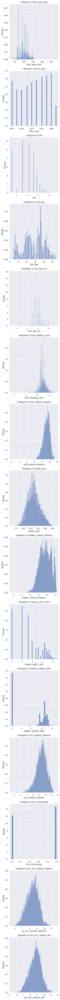

In [41]:
fig, axes = plt.subplots(len(numerical_features),1, figsize=(5,100))
count=0
for i in numerical_features:
    ttl='Histogram of '+i
    sns.histplot(data=train_clean_sel,x=i, stat='density',ax=axes[count]).set(title=ttl)
    count+=1

### Modelling

In [42]:
df_dummies=pd.get_dummies(train_clean_sel, drop_first=False)

In [43]:
df_dummies.shape

(150634, 84)

### Group Categorical Variables

In [44]:
pd.set_option('display.max_rows',None)
ridge_coefficient_df.sort_values(by='Coefficient_Value')

,Column_Name,Coefficient_Value
3,hdb_age,-48298.746776
10,mrt_nearest_distance,-24024.064419
38,town_WOODLANDS,-21132.970301
1,tranc_year,-16432.103147
7,hawker_nearest_distance,-14496.131812
33,town_SEMBAWANG,-14333.776410
27,town_JURONG WEST,-13168.031203
22,town_CHOA CHU KANG,-10892.484487
19,town_BUKIT PANJANG,-9445.409603
48,full_flat_type_3 ROOM Improved,-6867.969327


In [45]:
def split_categorical_variables(coefficient_df, col, split):
    lst_grp_names=[]
    for i in range(1,split+1):
        lst_grp_names.append('grp'+str(i)+'_'+col)
        
    min_town_coef=coefficient_df[coefficient_df['Column_Name'].str.startswith(col)]['Coefficient_Value'].min()
    max_town_coef=coefficient_df[coefficient_df['Column_Name'].str.startswith(col)]['Coefficient_Value'].max()
    town_intervals=(min_town_coef-max_town_coef)/split
    for i in range(1,(split+1)):
        lst_grp_names[i-1]=[]
        lst_grp_names[i-1]=lst_grp_names[i-1] + \
        (coefficient_df[(coefficient_df['Coefficient_Value'] - 1 < min_town_coef-(town_intervals * i)) & \
                        (coefficient_df['Coefficient_Value'] >= min_town_coef-(town_intervals * (i-1))) & \
                        (coefficient_df['Coefficient_Value'] != 0) & \
                       (coefficient_df['Column_Name'].str.startswith(col))]['Column_Name'].values.tolist())
    return lst_grp_names

In [46]:
# create lists of list of grouped categories for both `town` and `full_flat_type`
town_lol=split_categorical_variables(ridge_coefficient_df, 'town', 12)
# remove blank lists from lists of list
town_lol=[lst for lst in town_lol if lst != []]

fft_lol=split_categorical_variables(ridge_coefficient_df, 'full_flat_type', 13)
# remove blank lists from lists of list
fft_lol=[lst for lst in fft_lol if lst != []]

# combine both lists
lst_grps=town_lol+fft_lol
lst_grps

[['town_WOODLANDS'],
 ['town_JURONG WEST', 'town_SEMBAWANG'],
 ['town_BUKIT PANJANG', 'town_CHOA CHU KANG'],
 ['town_YISHUN'],
 ['town_JURONG EAST', 'town_SENGKANG'],
 ['town_ANG MO KIO',
  'town_BEDOK',
  'town_BUKIT BATOK',
  'town_HOUGANG',
  'town_PASIR RIS'],
 ['town_CENTRAL AREA', 'town_GEYLANG', 'town_KALLANG/WHAMPOA', 'town_PUNGGOL'],
 ['town_TAMPINES', 'town_TOA PAYOH'],
 ['town_BUKIT MERAH', 'town_BUKIT TIMAH', 'town_CLEMENTI', 'town_SERANGOON'],
 ['town_BISHAN', 'town_QUEENSTOWN'],
 ['town_MARINE PARADE'],
 ['full_flat_type_3 ROOM Improved', 'full_flat_type_4 ROOM Model A'],
 ['full_flat_type_3 ROOM New Generation'],
 ['full_flat_type_2 ROOM Improved',
  'full_flat_type_2 ROOM Model A',
  'full_flat_type_2 ROOM Standard',
  'full_flat_type_3 ROOM Model A',
  'full_flat_type_3 ROOM Standard'],
 ['full_flat_type_3 ROOM Premium Apartment', 'full_flat_type_4 ROOM Improved'],
 ['full_flat_type_1 ROOM Improved',
  'full_flat_type_2 ROOM 2-room',
  'full_flat_type_2 ROOM DBSS',
  '

In [47]:
def create_grp_names(col,number):
    lst_grp_names=[]
    for i in range(1,number+1):
        lst_grp_names.append('grp'+str(i)+'_'+col)
    return lst_grp_names

In [48]:
# create list of group names
lst_grp_names=create_grp_names('town',len(town_lol))
lst_grp_names=lst_grp_names+create_grp_names('full_flat_type',len(fft_lol))

Based on list created using coefficients, we further adjusted the groupings using domain knowledge. The final grouping is:

In [49]:
# `town`
grp1_town=['town_BUKIT TIMAH','town_MARINE PARADE']
grp2_town=['town_QUEENSTOWN','town_BISHAN']
grp3_town=['town_CLEMENTI','town_BUKIT MERAH','town_SERANGOON']
grp4_town=['town_PUNGGOL','town_GEYLANG','town_TAMPINES','town_KALLANG/WHAMPOA','town_CENTRAL AREA',
                 'town_TOA PAYOH']
grp5_town=['town_HOUGANG','town_BUKIT BATOK','town_BEDOK']
grp6_town=['town_JURONG EAST','town_PASIR RIS']
grp7_town=['town_YISHUN','town_SENGKANG']
grp8_town=['town_CHOA CHU KANG','town_JURONG WEST','town_BUKIT PANJANG']
grp9_town=['town_SEMBAWANG','town_WOODLANDS']
# note that 'town_ANG MO KIO' was dropped to mimic drop first col when dummifying

# `full_flat_type`
grp1_full_flat_type=['full_flat_type_4 ROOM Terrace','full_flat_type_3 ROOM Terrace']
grp2_full_flat_type=['full_flat_type_4 ROOM Type S1','full_flat_type_MULTI-GENERATION Multi Generation',
           'full_flat_type_5 ROOM Premium Apartment Loft','full_flat_type_5 ROOM DBSS',
           'full_flat_type_5 ROOM Improved-Maisonette','full_flat_type_5 ROOM Type S2']
grp3_full_flat_type=['full_flat_type_4 ROOM New Generation','full_flat_type_4 ROOM Simplified',
                'full_flat_type_5 ROOM Premium Apartment','full_flat_type_4 ROOM Premium Apartment',
                'full_flat_type_5 ROOM Improved','full_flat_type_4 ROOM Standard',
                'full_flat_type_EXECUTIVE Premium Apartment']
grp4_full_flat_type=['full_flat_type_3 ROOM DBSS','full_flat_type_EXECUTIVE Apartment','full_flat_type_5 ROOM Standard']

grp5_full_flat_type=['full_flat_type_EXECUTIVE Maisonette','full_flat_type_5 ROOM Adjoined flat',
                'full_flat_type_4 ROOM Adjoined flat','full_flat_type_4 ROOM DBSS']
grp6_full_flat_type=['full_flat_type_EXECUTIVE Premium Maisonette','full_flat_type_4 ROOM Premium Apartment Loft',
                'full_flat_type_EXECUTIVE Adjoined flat','full_flat_type_5 ROOM Model A-Maisonette']
grp7_full_flat_type=['full_flat_type_4 ROOM Model A','full_flat_type_4 ROOM Improved','full_flat_type_4 ROOM Model A2'
                    ]
grp7_5_full_flat_type=['full_flat_type_3 ROOM Simplified']
grp8_full_flat_type=['full_flat_type_3 ROOM Improved','full_flat_type_3 ROOM Standard',
           'full_flat_type_3 ROOM Premium Apartment','full_flat_type_3 ROOM Model A',
           'full_flat_type_3 ROOM New Generation']
grp9_full_flat_type=['full_flat_type_2 ROOM Standard','full_flat_type_2 ROOM Model A','full_flat_type_2 ROOM Improved',
               'full_flat_type_2 ROOM Premium Apartment']
grp10_full_flat_type=['full_flat_type_1 ROOM Improved']

# note that these 3 were dropped since coef low: 'full_flat_type_2 ROOM DBSS','full_flat_type_2 ROOM 2-room', 'full_flat_type_5 ROOM Model A'


In [50]:
lst_grps=[grp1_town, grp2_town, grp3_town, grp4_town, grp5_town, grp6_town, grp7_town, grp8_town, grp9_town, 
          grp1_full_flat_type, grp2_full_flat_type, grp3_full_flat_type, grp4_full_flat_type, grp5_full_flat_type, 
          grp6_full_flat_type, grp7_full_flat_type, grp8_full_flat_type, grp9_full_flat_type,grp10_full_flat_type, 
         grp7_5_full_flat_type]
lst_grp_names=['grp1_town', 'grp2_town', 'grp3_town', 'grp4_town', 'grp5_town', 'grp6_town', 'grp7_town', 'grp8_town', 
               'grp9_town', 'grp1_full_flat_type', 'grp2_full_flat_type', 'grp3_full_flat_type', 
               'grp4_full_flat_type', 'grp5_full_flat_type', 'grp6_full_flat_type', 'grp7_full_flat_type', 
               'grp8_full_flat_type', 'grp9_full_flat_type','grp10_full_flat_type'
              ,'grp7_5_full_flat_type']

In [51]:
# create new cols in df_dummies
count=0
for i in lst_grps:
    df_dummies[lst_grp_names[count]]=df_dummies[i].sum(axis=1)
    count+=1

### Drop Original Dummy Columns

In [52]:
df_dummies.drop(df_dummies.columns[df_dummies.columns.str.startswith('full_flat_type')],axis=1,inplace=True)
df_dummies.drop(df_dummies.columns[df_dummies.columns.str.startswith('town')],axis=1,inplace=True)

In [53]:
df_dummies.shape

(150634, 35)

### Heatmap after Dropping Redundant Columns

In [54]:
# create list of cols to hide
train_clean_sel_cols=train_clean_sel.columns.tolist()
train_clean_sel_cols.remove('resale_price')

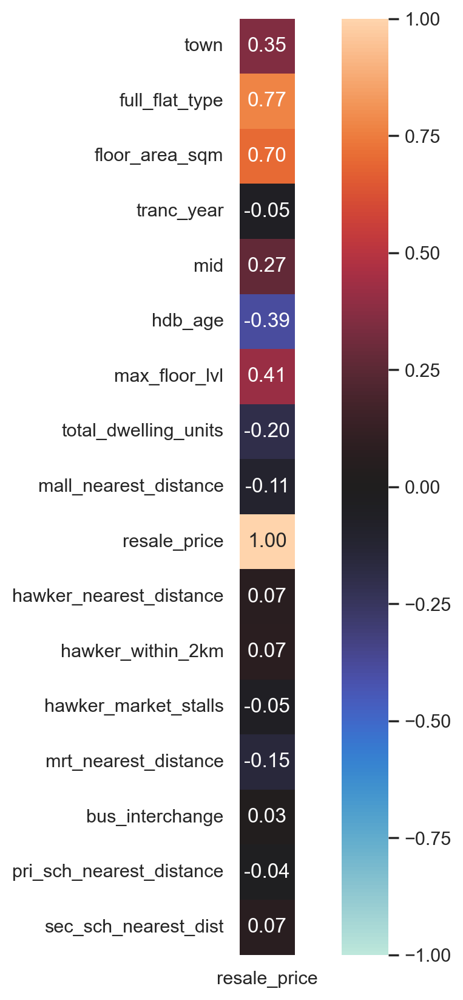

,resale_price
town,0.354096
full_flat_type,0.771997
floor_area_sqm,0.702840
tranc_year,-0.051373
mid,0.270499
hdb_age,-0.387753
max_floor_lvl,0.414352
total_dwelling_units,-0.201716
mall_nearest_distance,-0.105210
resale_price,1.000000


In [55]:
complete_correlation = associations(train_clean_sel, figsize=(10,10),hide_columns=train_clean_sel_cols)
# since data is stored as something akin to dictionary, with key being ['corr'], call key
df_complete_corr = complete_correlation['corr']
# style the table, drop NA, and precision of float
df_complete_corr.dropna(axis=1, how='all').dropna(axis=0, how='all').style.background_gradient(cmap='icefire', axis=None)

### Histogram

In [56]:
lst_cols=list(train_clean_sel.columns)

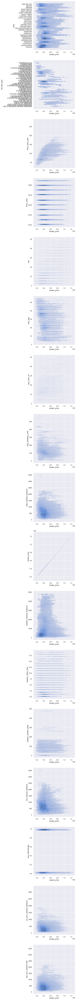

In [57]:
fig, axes = plt.subplots(len(lst_cols),1,figsize=(5,120))
count=0
for i in lst_cols:
    sns.histplot(train_clean.sort_values(by=i),x='resale_price',y=i,ax=axes[count])
    count+=1

## Modelling

In [58]:
X = df_dummies.drop('resale_price',axis=1)
y = df_dummies['resale_price']

### Model Prep: Train/test split

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size=0.3)

### Model Prep: PowerTransformer

In [60]:
pt = PowerTransformer()
pt.fit(X_train, y_train)
X_train_pt = pt.transform(X_train)
X_test_pt = pt.transform(X_test)

/Users/edenng/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:236: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/Users/edenng/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


In [61]:
import pickle
# saving PowerTransformer
pickle.dump(pt, open('powertransformer.pkl', 'wb'))

### Linear Regression (PowerTransformer)

In [62]:
# Create an instance of linear regression
lr = LinearRegression()

In [63]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lr, X_train_pt, y_train, cv=8).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lr, X_test_pt, y_test, cv=8).mean()}')

Cross-Validation Score on training set: 0.89669106470368
Cross-Validation Score on testing set: 0.8971169150302583


In [64]:
# Fit model instance on train data
lr.fit(X_train_pt, y_train)

LinearRegression()

In [65]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {lr.score(X_train_pt, y_train)}')
print(f'R^2 on testing set: {lr.score(X_test_pt, y_test)}')

R^2 on training set: 0.8969656525193926
R^2 on testing set: 0.897037905710409


In [66]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_pt)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_pt)))}')

MSE on training set: 217953965817.8215
MSE on testing set: 217291996040.78482


In [67]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_pt)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_pt)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_pt)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_pt)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 466855.4014015705
RMSE on testing set: 466145.89566013
RMSE (on training set) over mean y value: 1.0393931807172052
RMSE (on testing set) over mean y value: 1.0378135579322507


                 Column_Name  Coefficient_Value
3                    hdb_age          -0.160801
22                 grp9_town          -0.093949
21                 grp8_town          -0.081122
10      mrt_nearest_distance          -0.070538
1                 tranc_year          -0.064072
20                 grp7_town          -0.038253
30       grp8_full_flat_type          -0.032102
31       grp9_full_flat_type          -0.024491
7    hawker_nearest_distance          -0.024157
5       total_dwelling_units          -0.023373
6      mall_nearest_distance          -0.017543
18                 grp5_town          -0.014097
19                 grp6_town          -0.010637
29       grp7_full_flat_type          -0.010366
33     grp7_5_full_flat_type          -0.004692
32      grp10_full_flat_type          -0.004182
12  pri_sch_nearest_distance           0.005027
11           bus_interchange           0.009536
25       grp3_full_flat_type           0.010681
13      sec_sch_nearest_dist           0

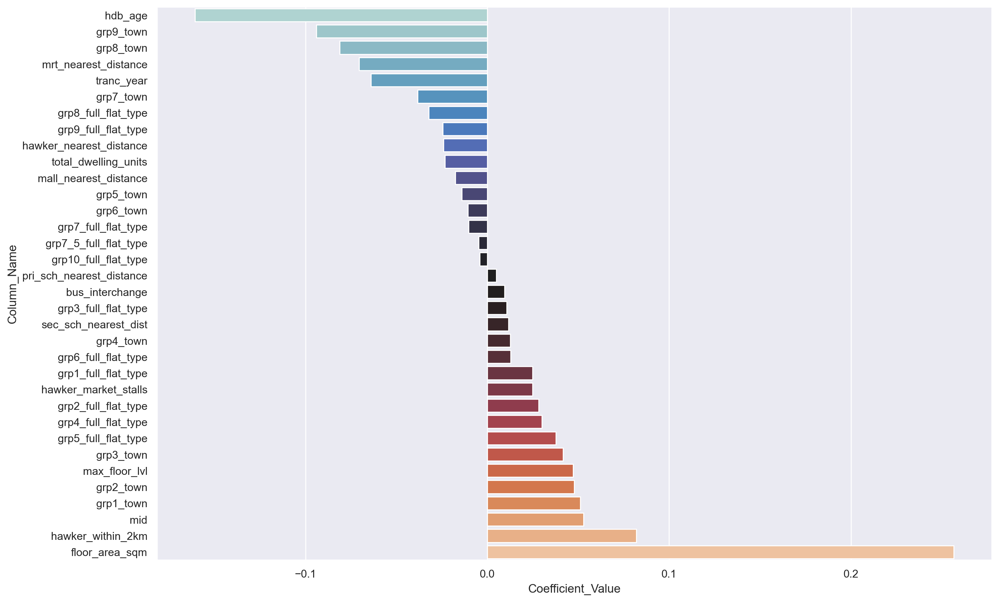

In [68]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(lr.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

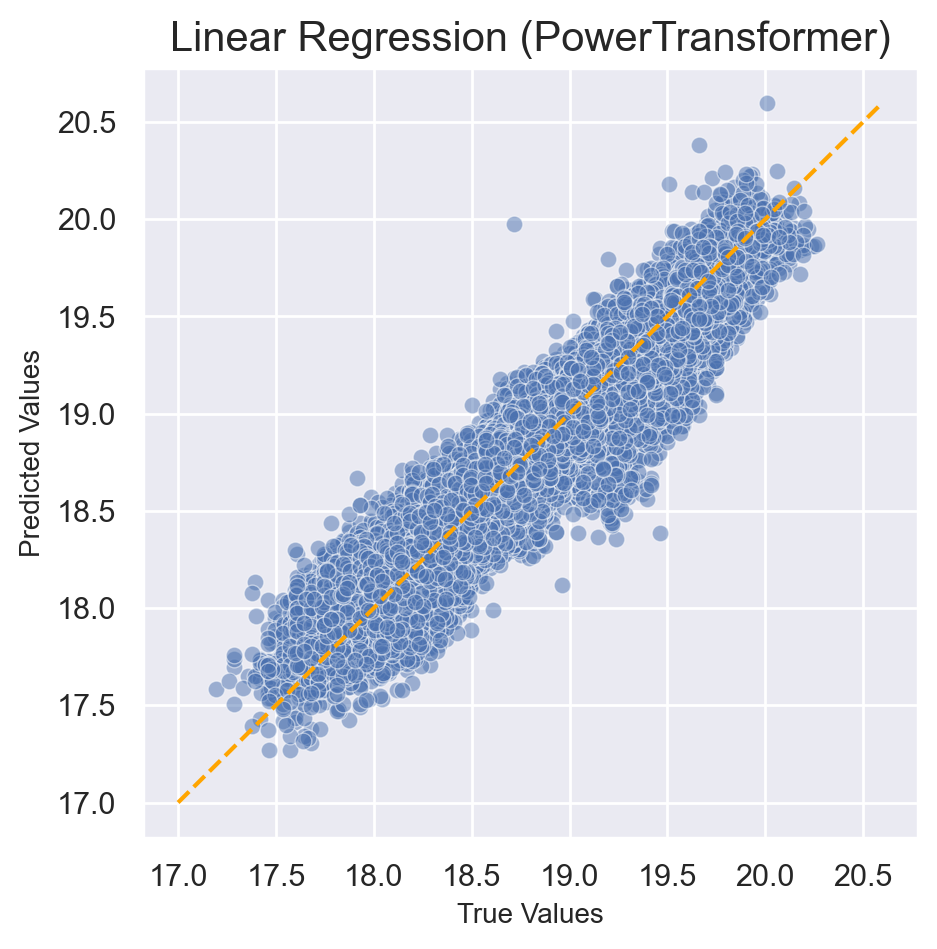

In [69]:
preds=lr.predict(X_test_pt)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Linear Regression (PowerTransformer)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Ridge (PowerTransformer)

In [70]:
%%time
ridge_alphas = np.logspace(0, 5, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=5)
optimal_ridge.fit(X_train_pt, y_train)

print (optimal_ridge.alpha_)

6.368249944718588
CPU times: user 1min 26s, sys: 1.71 s, total: 1min 28s
Wall time: 12.1 s


In [71]:
ridge = Ridge(alpha=optimal_ridge.alpha_)

In [72]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(ridge, X_train_pt, y_train, cv=3).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(ridge, X_test_pt, y_test, cv=3).mean()}')

Cross-Validation Score on training set: 0.8966873079897155
Cross-Validation Score on testing set: 0.8971307889570875


In [73]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_ridge.score(X_train_pt, y_train)}')
print(f'R^2 on testing set: {optimal_ridge.score(X_test_pt, y_test)}')

R^2 on training set: 0.8969656046640495
R^2 on testing set: 0.897036027761307


In [74]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_pt)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_pt)))}')

MSE on training set: 217944576539.31985
MSE on testing set: 217282994885.57404


In [75]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_pt)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_pt)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_pt)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_pt)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 466845.34541892976
RMSE on testing set: 466136.2406910388
RMSE (on training set) over mean y value: 1.0393707923722255
RMSE (on testing set) over mean y value: 1.0377920623920829


In [76]:
# saving the trained mode
pickle.dump(optimal_ridge, open('or_model2.pkl', 'wb'))

                 Column_Name  Coefficient_Value
3                    hdb_age          -0.160722
22                 grp9_town          -0.093869
21                 grp8_town          -0.081036
10      mrt_nearest_distance          -0.070524
1                 tranc_year          -0.064056
20                 grp7_town          -0.038192
30       grp8_full_flat_type          -0.032275
31       grp9_full_flat_type          -0.024552
7    hawker_nearest_distance          -0.024149
5       total_dwelling_units          -0.023398
6      mall_nearest_distance          -0.017537
18                 grp5_town          -0.014041
19                 grp6_town          -0.010591
29       grp7_full_flat_type          -0.010452
33     grp7_5_full_flat_type          -0.004741
32      grp10_full_flat_type          -0.004200
12  pri_sch_nearest_distance           0.005026
11           bus_interchange           0.009545
25       grp3_full_flat_type           0.010611
13      sec_sch_nearest_dist           0

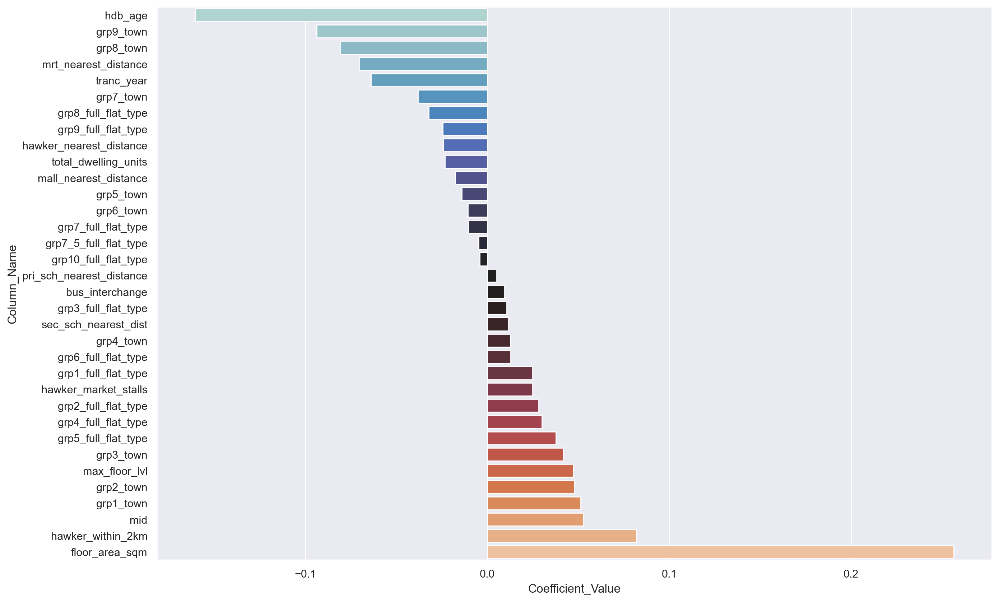

In [77]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_ridge.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

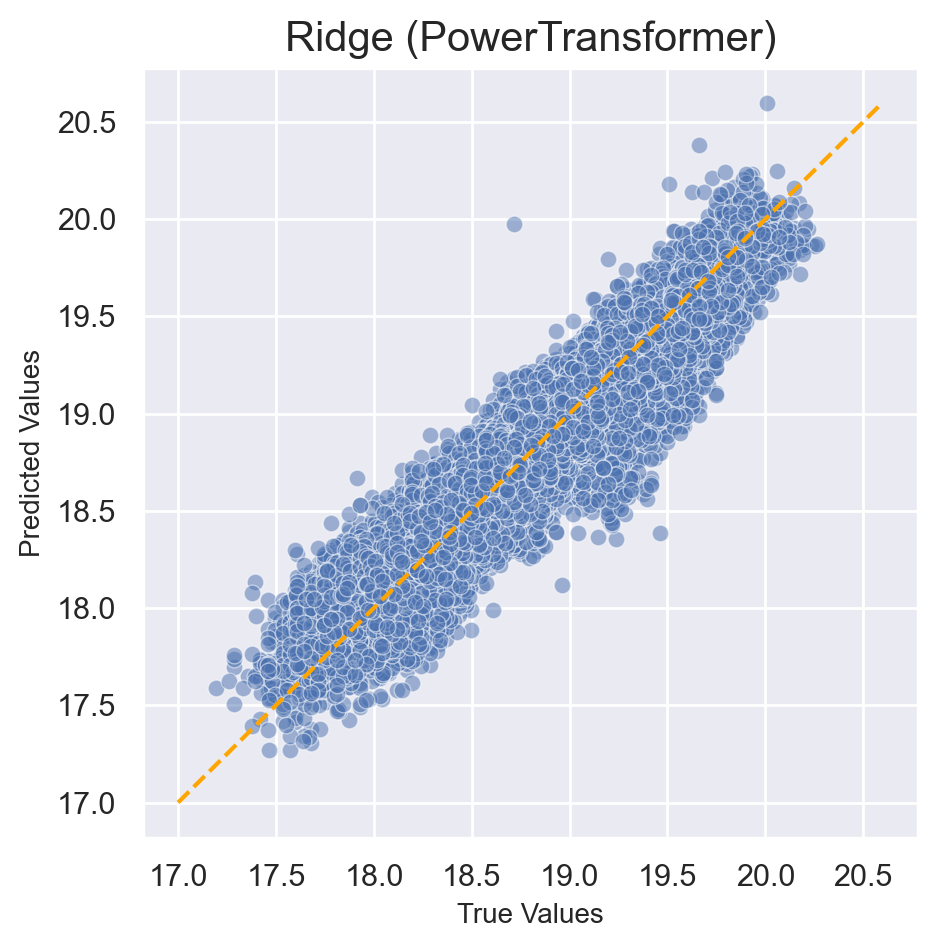

In [78]:
preds=optimal_ridge.predict(X_test_pt)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Ridge (PowerTransformer)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Lasso (PowerTransformer)

In [79]:
# Test out 200 different alpha values on default 5-folds of data set and adopt the best performing alpha
optimal_lasso = LassoCV(n_alphas=200, cv=5)
# model fitting
optimal_lasso.fit(X_train_pt, y_train)

LassoCV(cv=5, n_alphas=200)

In [80]:
lasso = Lasso(alpha=optimal_lasso.alpha_)

In [81]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lasso, X_train_pt, y_train, cv=5).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lasso, X_test_pt, y_test, cv=5).mean()}')

Cross-Validation Score on training set: 0.8966855801783143
Cross-Validation Score on testing set: 0.8971011949113541


In [82]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_lasso.score(X_train_pt, y_train)}')
print(f'R^2 on testing set: {optimal_lasso.score(X_test_pt, y_test)}')

R^2 on training set: 0.896941261105972
R^2 on testing set: 0.8969996899470379


In [83]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_pt)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_pt)))}')

MSE on training set: 217746363060.96277
MSE on testing set: 217092575433.7446


In [84]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_pt)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_pt)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_pt)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_pt)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 466633.00682759547
RMSE on testing set: 465931.9429205778
RMSE (on training set) over mean y value: 1.038898047956774
RMSE (on testing set) over mean y value: 1.0373372198245225


                 Column_Name  Coefficient_Value
3                    hdb_age          -0.159876
22                 grp9_town          -0.091957
21                 grp8_town          -0.078678
10      mrt_nearest_distance          -0.070321
1                 tranc_year          -0.063556
20                 grp7_town          -0.036075
30       grp8_full_flat_type          -0.028764
7    hawker_nearest_distance          -0.023292
31       grp9_full_flat_type          -0.023175
5       total_dwelling_units          -0.022928
6      mall_nearest_distance          -0.017118
18                 grp5_town          -0.012127
19                 grp6_town          -0.009152
29       grp7_full_flat_type          -0.007882
32      grp10_full_flat_type          -0.003636
33     grp7_5_full_flat_type          -0.003549
12  pri_sch_nearest_distance           0.004753
11           bus_interchange           0.009486
13      sec_sch_nearest_dist           0.011507
28       grp6_full_flat_type           0

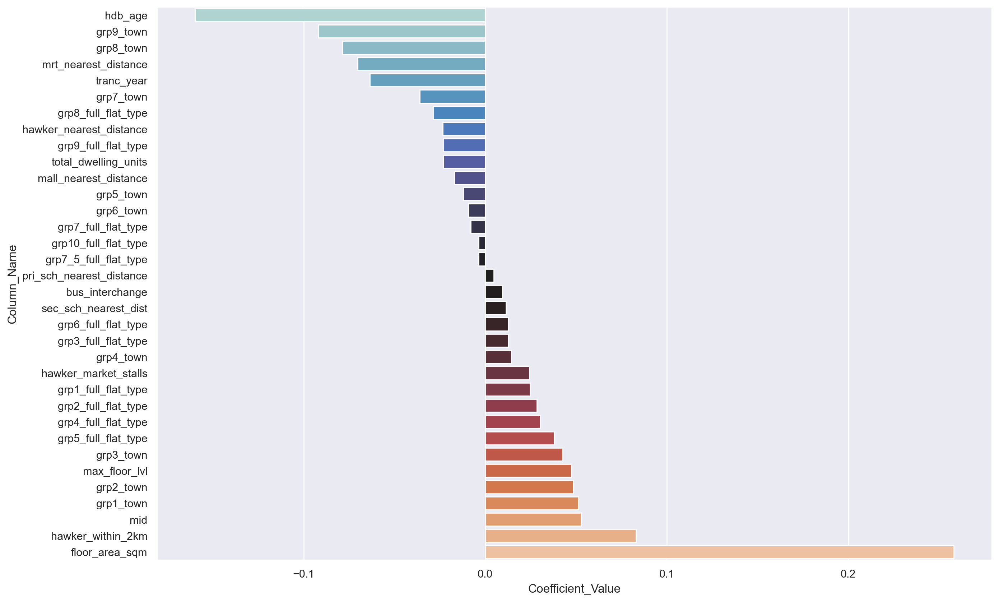

In [85]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_lasso.coef_)

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

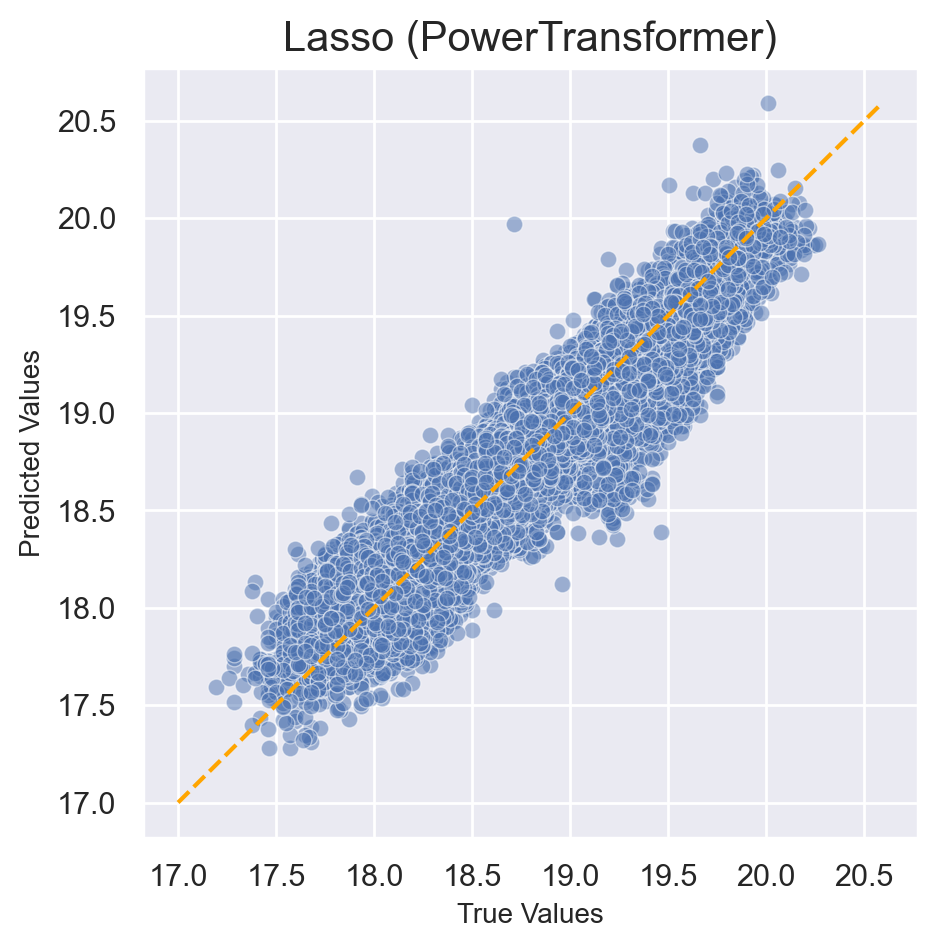

In [86]:
preds=optimal_lasso.predict(X_test_pt)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Lasso (PowerTransformer)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Model Prep: StandardScaler

In [87]:
ss = StandardScaler()
ss.fit(X_train)
X_train_sc = ss.transform(X_train)
X_test_sc = ss.transform(X_test)

### Linear Regression (StandardScaler)

In [88]:
# Create an instance of linear regression
lr = LinearRegression()

In [89]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lr, X_train_sc, y_train, cv=8).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lr, X_test_sc, y_test, cv=8).mean()}')

Cross-Validation Score on training set: 0.8964200900805728
Cross-Validation Score on testing set: 0.8966463082173113


In [90]:
# Fit model instance on train data
lr.fit(X_train_sc, y_train)

LinearRegression()

In [91]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {lr.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {lr.score(X_test_sc, y_test)}')

R^2 on training set: 0.8967150578434848
R^2 on testing set: 0.8965542780544453


In [92]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_sc)))}')

MSE on training set: 218096141093.48404
MSE on testing set: 217363982726.8076


In [93]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(lr.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(lr.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 467007.6456477817
RMSE on testing set: 466223.104025109
RMSE (on training set) over mean y value: 1.0397321328442242
RMSE (on testing set) over mean y value: 1.037985452372826


                 Column_Name  Coefficient_Value
3                    hdb_age          -0.161986
22                 grp9_town          -0.088027
21                 grp8_town          -0.075701
10      mrt_nearest_distance          -0.068249
1                 tranc_year          -0.065471
30       grp8_full_flat_type          -0.042261
31       grp9_full_flat_type          -0.035953
20                 grp7_town          -0.034265
5       total_dwelling_units          -0.025358
7    hawker_nearest_distance          -0.022323
6      mall_nearest_distance          -0.016320
18                 grp5_town          -0.009929
32      grp10_full_flat_type          -0.009453
33     grp7_5_full_flat_type          -0.008098
19                 grp6_town          -0.007068
29       grp7_full_flat_type          -0.004106
12  pri_sch_nearest_distance           0.004663
13      sec_sch_nearest_dist           0.009075
28       grp6_full_flat_type           0.011683
11           bus_interchange           0

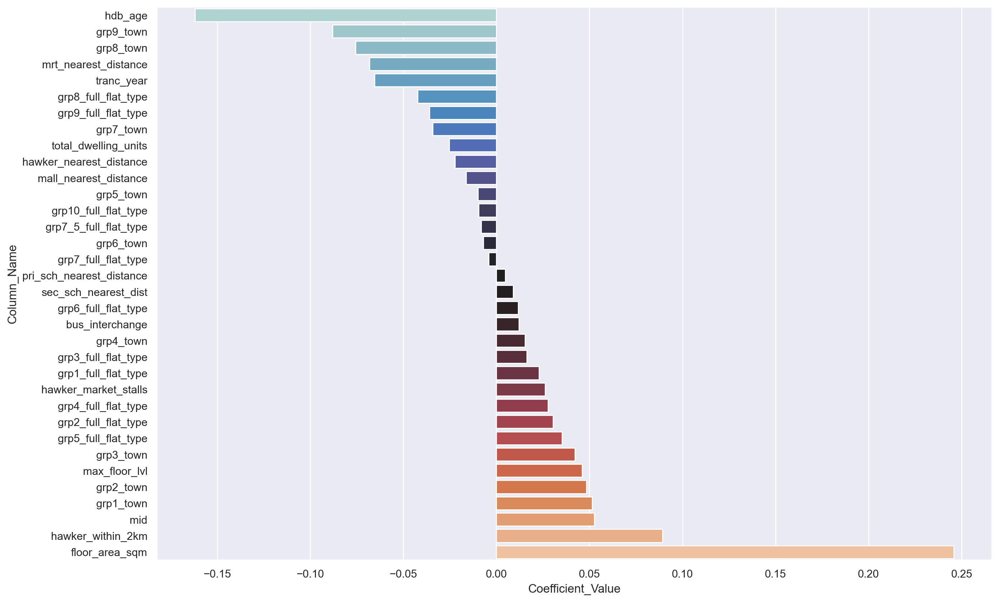

In [94]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(lr.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

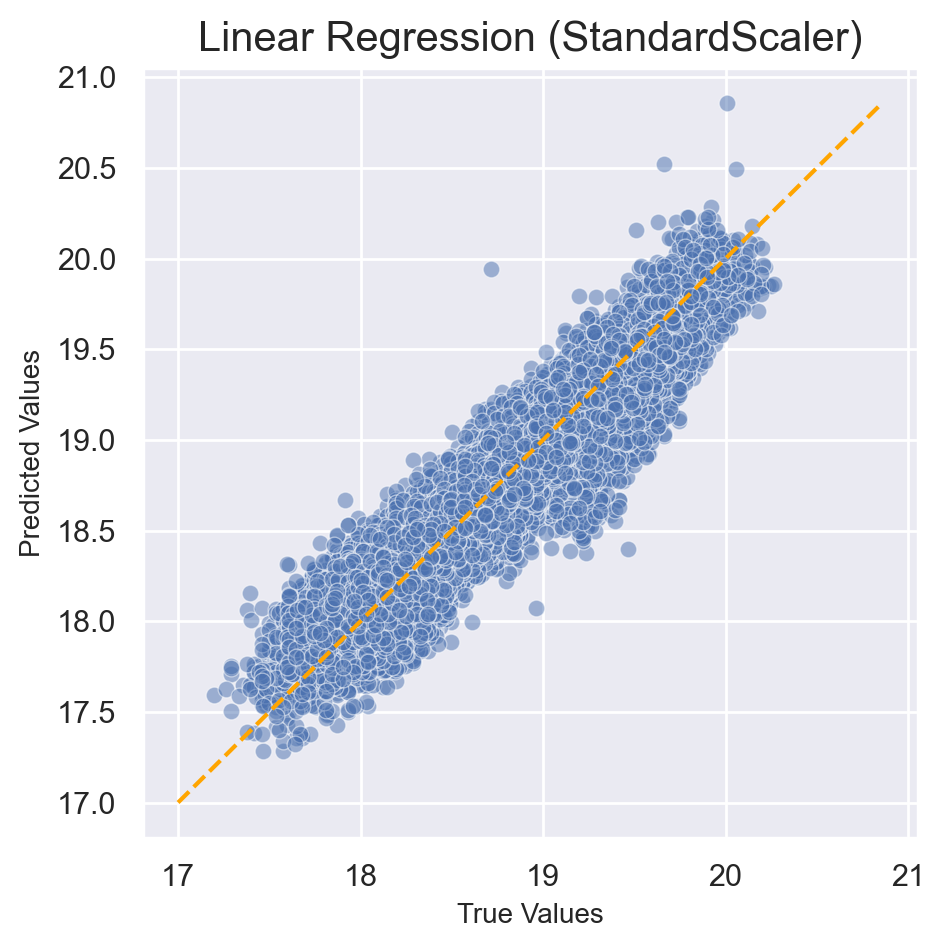

In [95]:
preds=lr.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Linear Regression (StandardScaler)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Ridge (StandardScaler)

In [96]:
%%time
ridge_alphas = np.logspace(0, 5, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=5)
optimal_ridge.fit(X_train_sc, y_train)

print (optimal_ridge.alpha_)

12.033778407775898
CPU times: user 1min 37s, sys: 2.12 s, total: 1min 39s
Wall time: 13 s


In [97]:
ridge = Ridge(alpha=optimal_ridge.alpha_)

In [98]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(ridge, X_train_sc, y_train, cv=3).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(ridge, X_test_sc, y_test, cv=3).mean()}')

Cross-Validation Score on training set: 0.8964162159170709
Cross-Validation Score on testing set: 0.8966661081103937


In [99]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_ridge.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_ridge.score(X_test_sc, y_test)}')

R^2 on training set: 0.8967149177574893
R^2 on testing set: 0.8965509315903135


In [100]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_sc)))}')

MSE on training set: 218078519500.58243
MSE on testing set: 217347274840.7075


In [101]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(optimal_ridge.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(optimal_ridge.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 466988.7787737329
RMSE on testing set: 466205.185343007
RMSE (on training set) over mean y value: 1.0396901281888877
RMSE (on testing set) over mean y value: 1.0379455587442457


                 Column_Name  Coefficient_Value
3                    hdb_age          -0.161839
22                 grp9_town          -0.087902
21                 grp8_town          -0.075569
10      mrt_nearest_distance          -0.068227
1                 tranc_year          -0.065439
30       grp8_full_flat_type          -0.042523
31       grp9_full_flat_type          -0.036035
20                 grp7_town          -0.034174
5       total_dwelling_units          -0.025406
7    hawker_nearest_distance          -0.022313
6      mall_nearest_distance          -0.016311
18                 grp5_town          -0.009847
32      grp10_full_flat_type          -0.009475
33     grp7_5_full_flat_type          -0.008170
19                 grp6_town          -0.007001
29       grp7_full_flat_type          -0.004242
12  pri_sch_nearest_distance           0.004662
13      sec_sch_nearest_dist           0.009070
28       grp6_full_flat_type           0.011691
11           bus_interchange           0

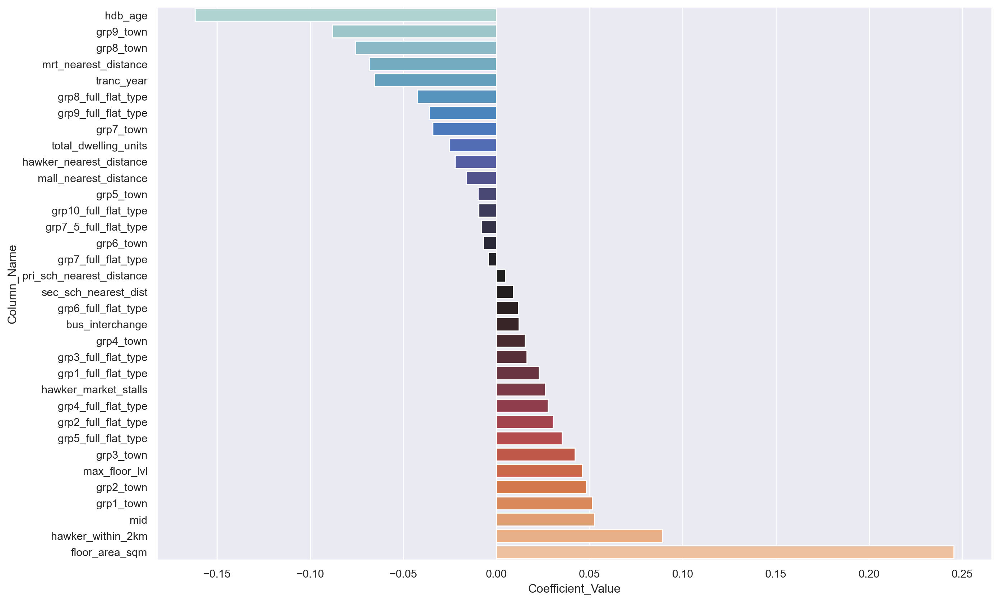

In [102]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_ridge.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

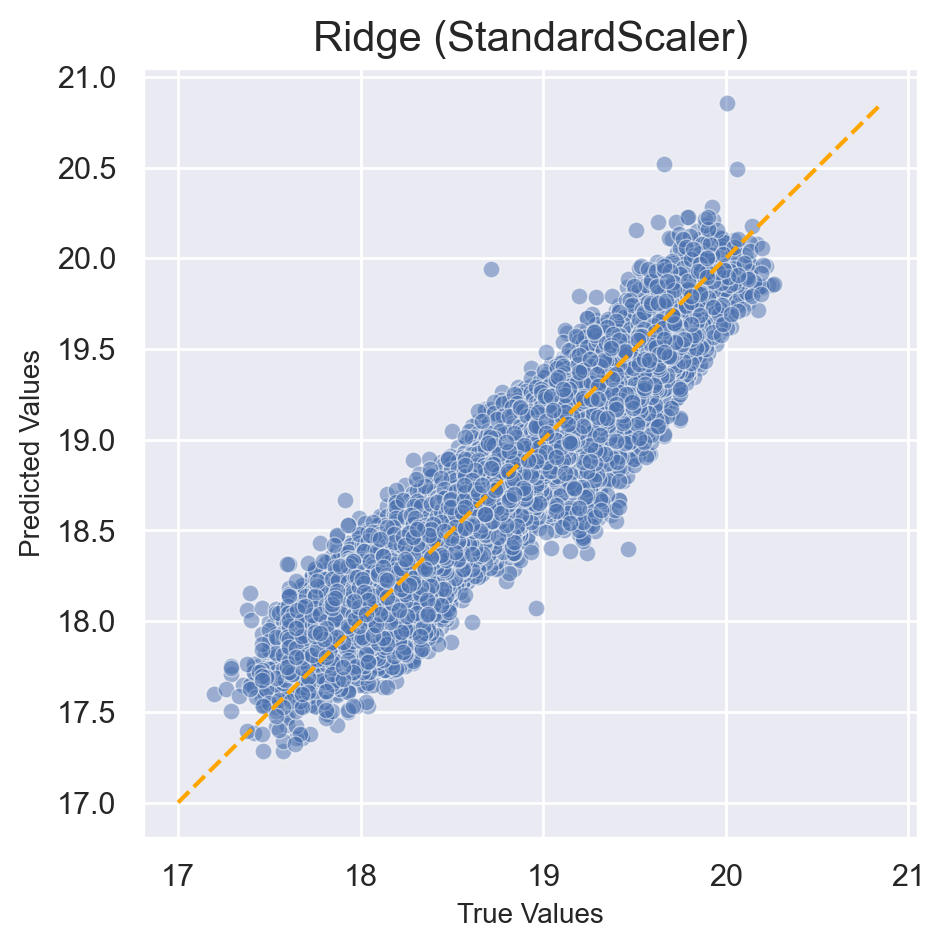

In [103]:
preds=optimal_ridge.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Ridge (StandardScaler)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Lasso (StandardScaler)

In [104]:
# Test out 200 different alpha values on default 5-folds of data set and adopt the best performing alpha
optimal_lasso = LassoCV(n_alphas=200, cv=5)
# model fitting
optimal_lasso.fit(X_train_sc, y_train)

LassoCV(cv=5, n_alphas=200)

In [105]:
lasso = Lasso(alpha=optimal_lasso.alpha_)

In [106]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lasso, X_train_sc, y_train, cv=5).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lasso, X_test_sc, y_test, cv=5).mean()}')

Cross-Validation Score on training set: 0.896417137874106
Cross-Validation Score on testing set: 0.8966339129429443


In [107]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {optimal_lasso.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_lasso.score(X_test_sc, y_test)}')

R^2 on training set: 0.8966910481785269
R^2 on testing set: 0.8965132085343124


In [108]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_sc)))}')

MSE on training set: 217892230337.053
MSE on testing set: 217168885131.18405


In [109]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, 2**(optimal_lasso.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, 2**(optimal_lasso.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 466789.27830130485
RMSE on testing set: 466013.8250429745
RMSE (on training set) over mean y value: 1.0392459661850446
RMSE (on testing set) over mean y value: 1.0375195197816105


                 Column_Name  Coefficient_Value
3                    hdb_age          -0.161143
22                 grp9_town          -0.085952
21                 grp8_town          -0.073144
10      mrt_nearest_distance          -0.068037
1                 tranc_year          -0.064964
30       grp8_full_flat_type          -0.039112
31       grp9_full_flat_type          -0.034750
20                 grp7_town          -0.031984
5       total_dwelling_units          -0.024948
7    hawker_nearest_distance          -0.021470
6      mall_nearest_distance          -0.015919
32      grp10_full_flat_type          -0.008946
18                 grp5_town          -0.007861
33     grp7_5_full_flat_type          -0.007021
19                 grp6_town          -0.005503
29       grp7_full_flat_type          -0.001684
12  pri_sch_nearest_distance           0.004397
13      sec_sch_nearest_dist           0.008870
28       grp6_full_flat_type           0.011492
11           bus_interchange           0

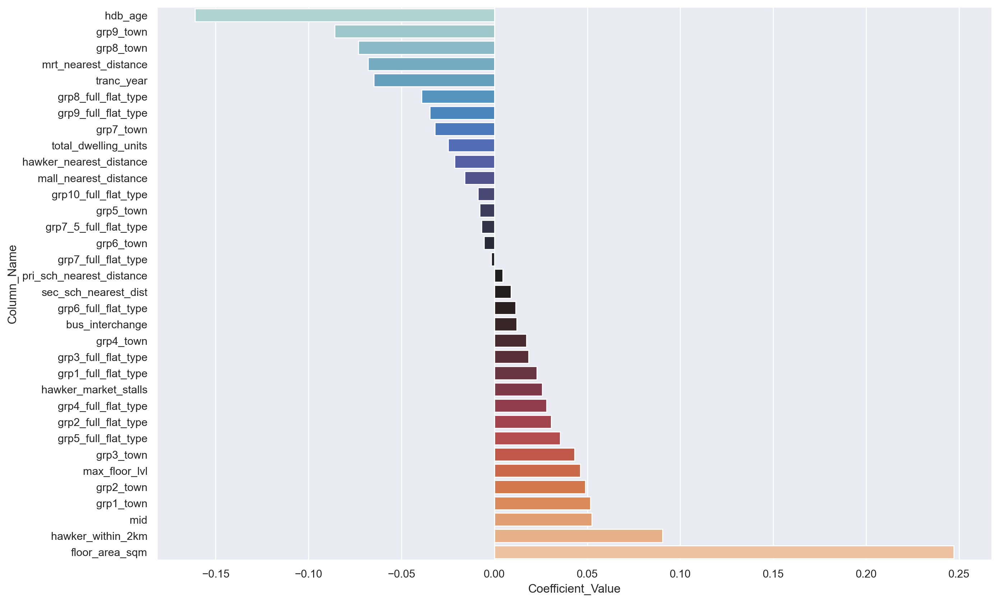

In [110]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_lasso.coef_)

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

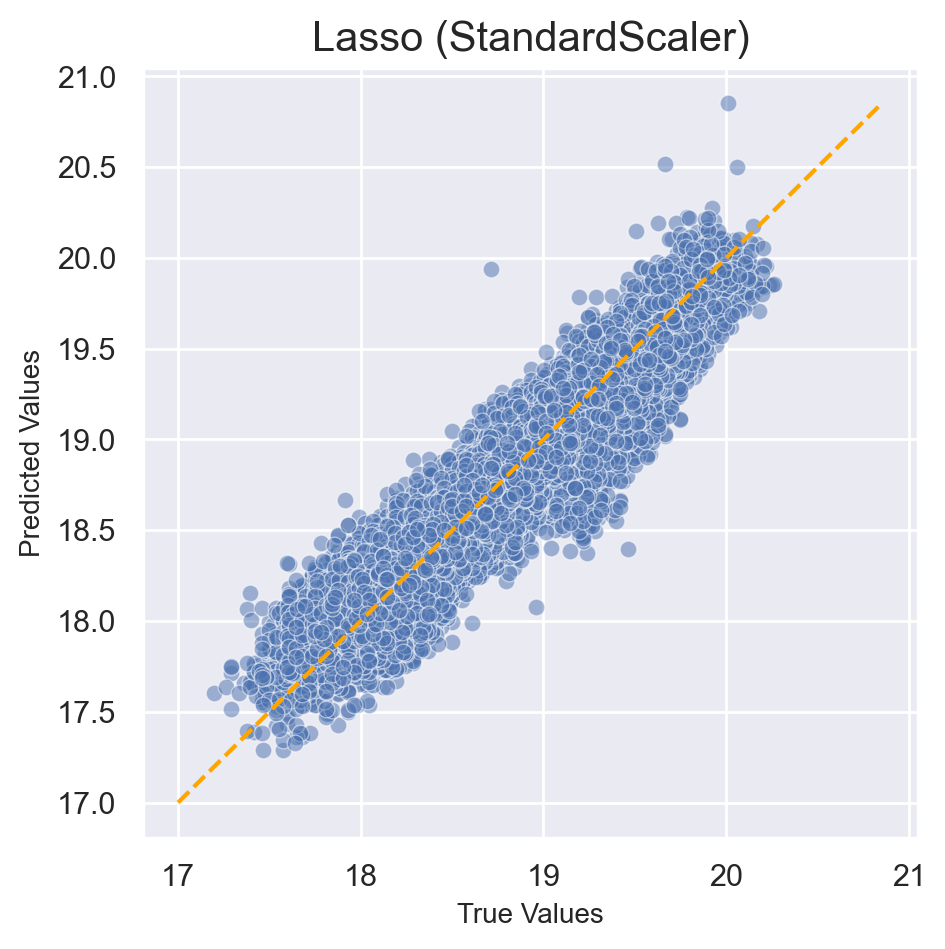

In [111]:
preds=optimal_lasso.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)

# Line showing perfect predictions.
plt.plot([17, max(max(y_test),max(preds))],
         [17, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Lasso (StandardScaler)', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Fit a Linear Regression model in `statsmodels` predicting `resale_price`.

In [112]:
# Remember, we need to add a constant in statsmodels!
import statsmodels.api as sm
X_train_c = sm.add_constant(X_train)

In [113]:
model_sm = sm.OLS(y_train, X_train_c).fit()

In [114]:
model_sm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           resale_price   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                 1.153e+04
Date:                Thu, 08 Jun 2023   Prob (F-statistic):               0.00
Time:                        23:56:12   Log-Likelihood:                 24665.
No. Observations:               45190   AIC:                        -4.926e+04
Df Residuals:                   45155   BIC:                        -4.895e+04
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       66.6289      0.499    133.393      0.000      65.650      67.608
floor_area_sqm               0.0101   6.04e-05    166.833      0.000       0.010       0.010
tranc_year                  -0.0238      0.000    -96.261      0.000      -0.024      -0.023
mid                          0.0613      0.001     71.203      0.000       0.060       0.063
hdb_age                     -0.0133   9.07e-05   -147.142      0.000      -0.014      -0.013
max_floor_lvl                0.0903      0.002     40.350      0.000       0.086       0.095
total_dwelling_units        -0.0389      0.002    -25.347      0.000      -0.042      -0.036
mall_nearest_distance       -0.0187      0.001    -21.286      0.000      -0.020      -0.017
hawker_nearest_distance     -0.0158      0.001    -19.094      0.000      -0.017      -0.014
hawker_within_2km            0.0726      0.001     62.509      0.000       0.070       0.075
hawker_market_stalls         0.0083      0.000     27.476      0.000       0.008       0.009
mrt_nearest_distance        -0.0791      0.001    -93.252      0.000      -0.081      -0.077
bus_interchange              0.0243      0.002     14.733      0.000       0.021       0.027
pri_sch_nearest_distance     0.0056      0.001      6.616      0.000       0.004       0.007
sec_sch_nearest_dist         0.0107      0.001     12.905      0.000       0.009       0.012
grp1_town                    0.5485      0.008     68.255      0.000       0.533       0.564
grp2_town                    0.2279      0.005     49.574      0.000       0.219       0.237
grp3_town                    0.1526      0.004     37.864      0.000       0.145       0.161
grp4_town                    0.0371      0.004      9.710      0.000       0.030       0.045
grp5_town                   -0.0281      0.004     -7.272      0.000      -0.036      -0.021
grp6_town                   -0.0312      0.005     -6.660      0.000      -0.040      -0.022
grp7_town                   -0.0987      0.004    -23.861      0.000      -0.107      -0.091
grp8_town                   -0.2095      0.004    -49.021      0.000      -0.218      -0.201
grp9_town                   -0.2908      0.004    -64.978      0.000      -0.300      -0.282
grp1_full_flat_type          0.9207      0.028     33.352      0.000       0.867       0.975
grp2_full_flat_type          0.3075      0.009     33.648      0.000       0.290       0.325
grp3_full_flat_type          0.0342      0.006      5.609      0.000       0.022       0.046
grp4_full_flat_type          0.1255      0.007     19.285      0.000       0.113       0.138
grp5_full_flat_type          0.1919      0.007     28.217      0.000       0.179       0.205
grp6_full_flat_type          0.2371      0.015     16.226      0.000       0.208       0.266
grp7_full_flat

### Kaggle Submission

In [115]:
lst_sel_cols.remove('resale_price')

In [116]:
test_clean_sel=test_clean[lst_sel_cols]
df_dummies_test=pd.get_dummies(test_clean_sel, drop_first=True)
df_dummies_test.shape

(16737, 78)

In [117]:
for grp_name in lst_grps:
    for col_name in grp_name:
        if col_name not in list(df_dummies_test.columns):
            grp_name.remove(col_name)

In [118]:
count=0
for i in lst_grps:
    df_dummies_test[lst_grp_names[count]]=df_dummies_test[i].sum(axis=1)
    count+=1

In [119]:
df_dummies_test.drop(df_dummies_test.columns[df_dummies_test.columns.str.startswith('full_flat_type')],axis=1,inplace=True)
df_dummies_test.drop(df_dummies_test.columns[df_dummies_test.columns.str.startswith('town')],axis=1,inplace=True)

In [120]:
df_dummies_test.shape

(16737, 34)

In [121]:
lst_log.remove('resale_price')

In [122]:
# log some cols
for i in lst_log:
    df_dummies_test[i] = np.log2(df_dummies_test[i]+1)

In [123]:
# Setting the transforming the test_data variables
test_clean_pt = pt.transform(df_dummies_test)

# Perdict the sale price using Ridge Regression
ridge_pred = optimal_ridge.predict(test_clean_pt)

# Inverse the y (saleprice) since it is in the log form
test_clean['log_resale_price'] = ridge_pred
test_clean['Predicted'] = round(2**test_clean['log_resale_price'],0)

display(test_clean[['floor_area_sqm','hawker_within_2km','mid','Predicted']].head())

,floor_area_sqm,hawker_within_2km,mid,Predicted
0,84.0,1.0,8,377068.0
1,112.0,0.0,5,488132.0
2,68.0,11.0,8,345710.0
3,97.0,2.0,2,297157.0
4,103.0,2.0,17,450000.0


In [124]:
test_clean.columns

Index(['id', 'tranc_yearmonth', 'town', 'flat_type', 'block', 'street_name',
       'storey_range', 'floor_area_sqm', 'flat_model', 'lease_commence_date',
       'tranc_year', 'tranc_month', 'mid_storey', 'lower', 'upper', 'mid',
       'full_flat_type', 'address', 'floor_area_sqft', 'price_per_sqft',
       'hdb_age', 'max_floor_lvl', 'year_completed', 'residential',
       'commercial', 'market_hawker', 'multistorey_carpark',
       'precinct_pavilion', 'total_dwelling_units', '1room_sold', '2room_sold',
       '3room_sold', '4room_sold', '5room_sold', 'exec_sold', 'multigen_sold',
       'studio_apartment_sold', '1room_rental', '2room_rental', '3room_rental',
       'other_room_rental', 'postal', 'latitude', 'longitude', 'planning_area',
       'mall_nearest_distance', 'mall_within_500m', 'mall_within_1km',
       'mall_within_2km', 'hawker_nearest_distance', 'hawker_within_500m',
       'hawker_within_1km', 'hawker_within_2km', 'hawker_food_stalls',
       'hawker_market_stalls', '

In [125]:
test_clean_pt

array([[-0.49454174, -1.58074485,  0.2136115 , ..., -0.11007603,
        -0.02445065, -0.11442207],
       [ 0.64388644,  0.91730154, -0.46890794, ..., -0.11007603,
        -0.02445065, -0.11442207],
       [-1.22857697, -1.24774035,  0.2136115 , ..., -0.11007603,
        -0.02445065, -0.11442207],
       ...,
       [ 0.56747755,  0.53567867, -0.46890794, ..., -0.11007603,
        -0.02445065, -0.11442207],
       [-0.49454174,  1.30767596,  0.2136115 , ..., -0.11007603,
        -0.02445065, -0.11442207],
       [ 0.33415249, -1.58074485,  0.2136115 , ..., -0.11007603,
        -0.02445065, -0.11442207]])

In [126]:
ridge_pred

array([18.52446699, 18.89691089, 18.39920337, ..., 18.61257533,
       18.78933727, 18.51566173])

In [127]:
test_export = test_clean[['id', 'Predicted']]

In [128]:
test_export=test_export.rename(columns={'id': 'Id'})
test_export

,Id,Predicted
0,114982,377068.0
1,95653,488132.0
2,40303,345710.0
3,109506,297157.0
4,100149,450000.0
5,7610,331480.0
6,61101,312351.0
7,68167,440744.0
8,65701,362043.0
9,56039,272725.0


In [130]:
# Export the simpler version of the predicted saleprice to csv
test_export.to_csv("../datasets/predicted_resale_price.csv",index=False)

# Insights

Based on the above, 
1) <b>Our production model can accurately and reliably predict HDB resale prices </b>
- Our model explains approximately 90% of the variance in resale price
- Our predictions have an average error of \\$46,193, approximately 10% of mean resale price.
- A similar result was returned when predicting the kaggle(test) dataset, which proves the reliability of our model.

2) <b>Floor area, number of nearby hawkers, and floor level are the strongest positive predictors of resale prices </b>
- Floor area is the strongest predictor, which is expected. The larger the flat, the greater the price.
- We expect prices to increase with a higher number of hawkers nearby. However it is surprisingly the second most important feature in our dataset.
- Higher floors provide better view and privacy, and is generally desirable.

3) <b>HDB age, location, and distance from MRT are the strongest negative predictors of resale prices </b>
- HDB age is the strongest negative predictor, almost double that of location/distance. The older the flat, the shorter the lease, making the flat less desirable.
- The following locations negatively affects the price predictions the most: Sembawang, Woodlands, Choa Chu Kang, Jurong West, and Bukit Panjang.
- MRT is a main mode of transport for many in Singapore. The greater the distance from the flat to the MRT, the lower the price.

# Business Recommendations

1. <b>To maximise commissions for the least effort, the agency may wish to leverage the prediction model and consider different strategies at different levels: </b>
    - <u>First, town level.</u> Increase ad and marketing spend at priority towns 
    - <u>Second, neighbourhood level.</u> Increase on-ground efforts, e.g. roadshows at hawker centres, incentivise and provide a free predictor tool to prospective sellers/buyers (another version for subscribers of agency’s mailing list)
    - <u>Third, block/unit level.</u> Increase on-ground efforts, e.g. door-to-door marketing at higher floors, bigger floor area 

    E.g. hawker centres / 4-5room blocks at Pinnacle@Duxton, Clementi, Bt Timah, Marine Parade<br><br>

2. <b>Up-play positive features during pitch to prospective sellers and buyers (i.e. maximising buyers/sellers’ returns) </b>
    - e.g. to sellers, agents can inform them that their units can fetch high price due to the characteristics of their home, which are attractive and in demand to buyers; to buyers (first-time or those who wish to upgrade), they can view such homes as a long-term investment asset, or even leverage uptrend rental market and generate passive income when renting out rooms. <br><br>

3. <b>Earn reputation as a trusted top advisor in the real estate industry</b>
    - to prospective sellers/buyers - regularly provide content on features of interest (e.g. electronic direct mail, news and articles) 


